# Libraries

In [20]:
import os
import math
import numpy as np
from scipy import signal
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size']   = 12

axisFontSize  = 14
titleFontSize = 20

# Parameters

#### Data Path

In [42]:
tracePath = '/Volumes/Ohbin_SSD/UROP/virtual_trace'
traceNum = 10

#### Spectrogram

In [22]:
samplingFrequency = int(20e9)  # unit: Hz (set this from the setting of oscilloscope)
windowLength      = 500      # The number of samples in the window.
noverlap          = 450       # Number of points to overlap between segments. If None, noverlap = nperseg // 8. Defaults to None.

#### FIR (Finite Impulse Response) filter

In [23]:
filterOrder  = int(1e3 - 1)            # Length of the filter (number of coefficients, i.e. the filter order + 1). numtaps must be odd if a passband includes the Nyquist frequency
filterWidth  = None                    # If width is not None, then assume it is the approximate width of the transition region (expressed in the same units as fs) for use in Kaiser FIR filter design. In this case, the window argument is ignored.
bandPassFreq = [int(50e6), int(150e6)]#, int(895e6), int(905e6), int(995e6), int(1005e6)]#[int(15e6), int(25e6)]  # Cutoff frequency of filter (expressed in the same units as fs) OR an array of cutoff frequencies (that is, band edges). In the latter case, the frequencies in cutoff should be positive and monotonically increasing between 0 and fs/2. The values 0 and fs/2 must not be included in cutoff.

#### Alignment

In [66]:
referenceTraceIndex = 3
referenceTraceXrange = [230000, 240000]# [9500, 44500] #[39000, 44900] #[42900, 44900]
correlationCriterion = 0.22           # drop the trace whose maximum of the correlation between the trace and reference trace is under that
traceCutRange = [10000, 35000]

MAwindowSize = 500
jump         = 1
bound        = 5000

#### result

In [26]:
resultFolderName = '{}/alignment_and_drop'.format(tracePath)
os.makedirs(resultFolderName, exist_ok=True)
print(resultFolderName)

with open('{}/parameters.txt'.format(resultFolderName), 'w') as fp:
    fp.write('tracePath: {}\n'.format(tracePath))  
    fp.write('filterOrder: {}\n'.format(filterOrder))    
    fp.write('filterWidth: {}\n'.format(filterWidth))    
    fp.write('bandPassFreq: {}\n'.format(bandPassFreq))    
    fp.write('referenceTraceIndex: {}\n'.format(referenceTraceIndex))   
    fp.write('referenceTraceXrange: {}\n'.format(referenceTraceXrange))    
    fp.write('correlationCriterion: {}\n'.format(correlationCriterion))    
    fp.write('traceCutRange: {}\n'.format(traceCutRange))    
    fp.write('MAwindowSize: {}\n'.format(MAwindowSize))    
    fp.write('jump: {}\n'.format(jump))    
    fp.write('bound: {}\n'.format(bound))   

/Volumes/Ohbin_SSD/UROP/virtual_trace/alignment_and_drop


# Select Band Pass Freq

In [27]:
firCoeff = signal.firwin(numtaps=filterOrder, cutoff=bandPassFreq, width=filterWidth, window='hamming', fs=samplingFrequency, pass_zero=False)

In [28]:
trace_index_range = [0, 10]

  0%|          | 0/10 [00:00<?, ?it/s]

0


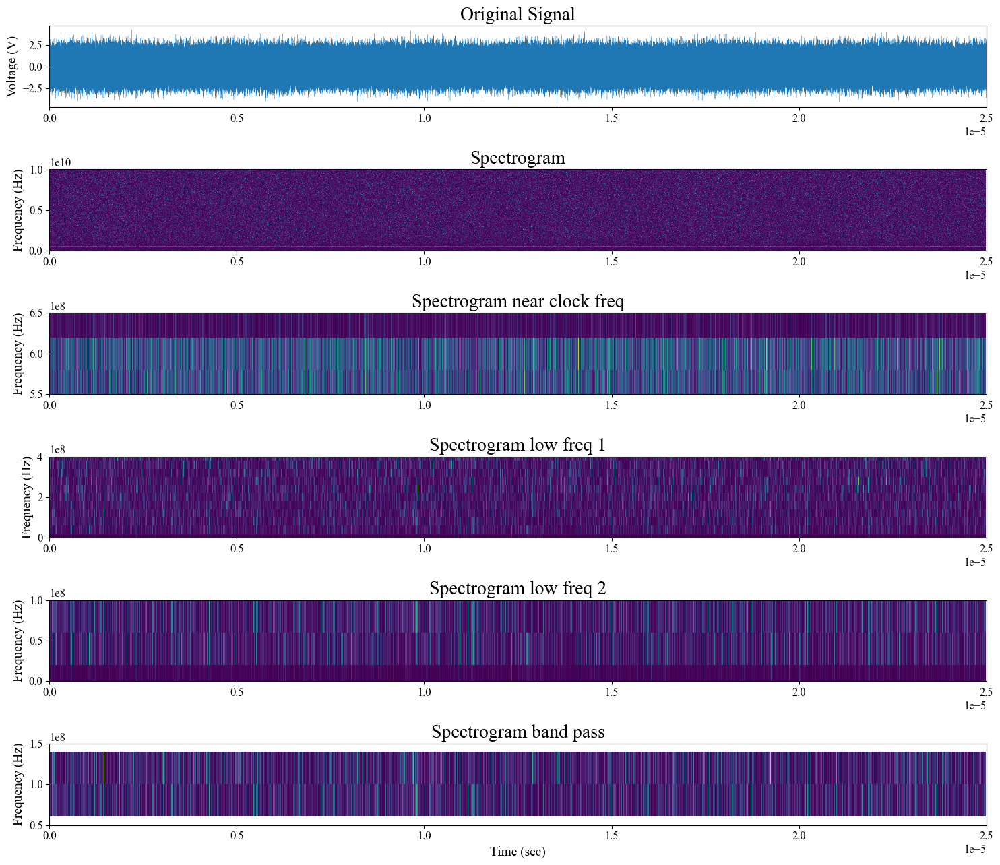

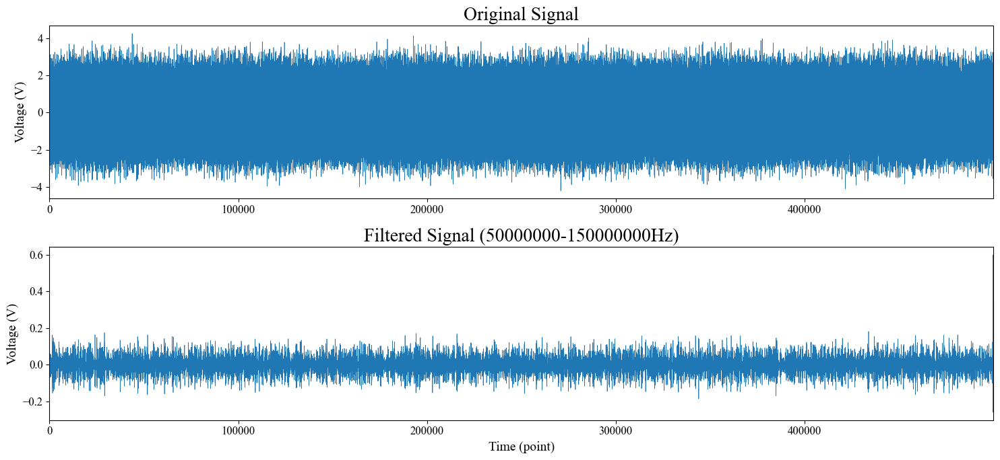

1


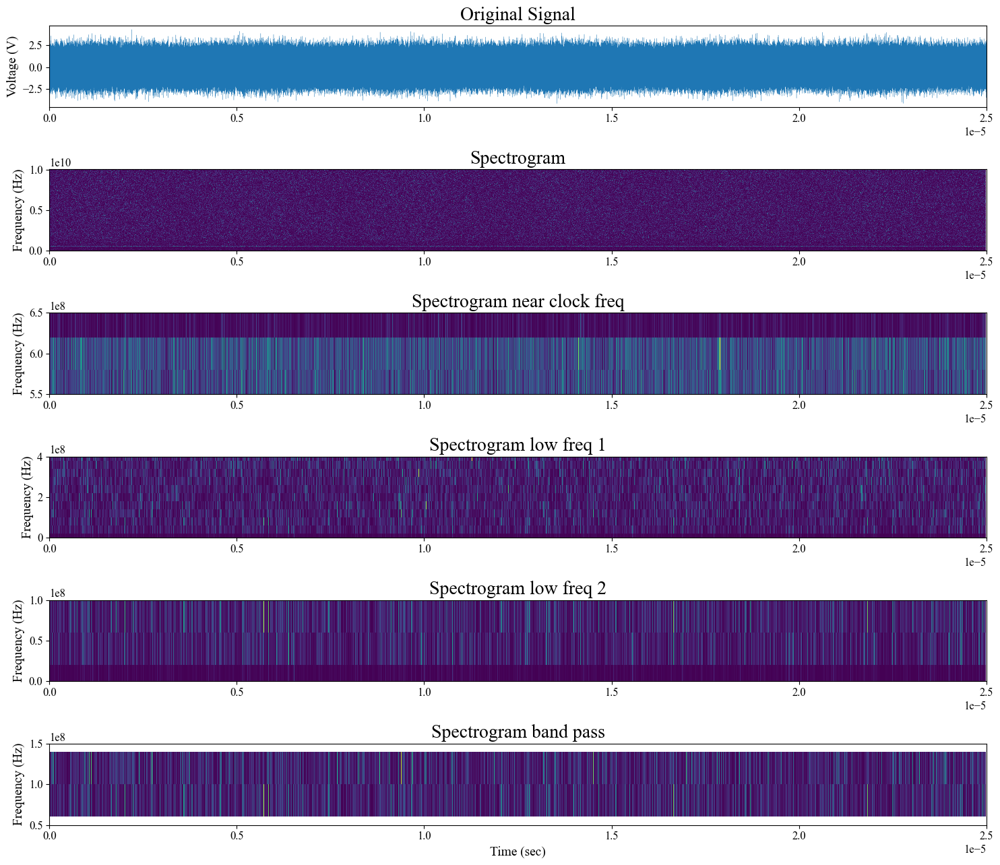

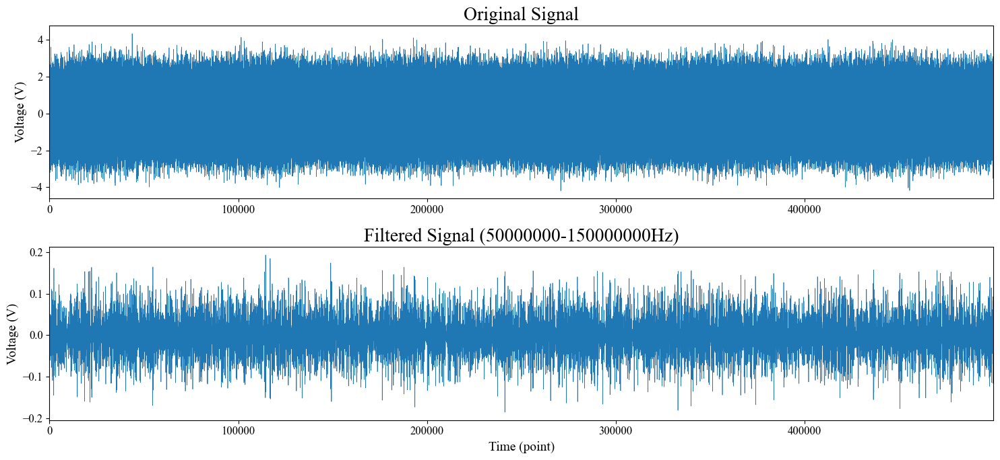

2


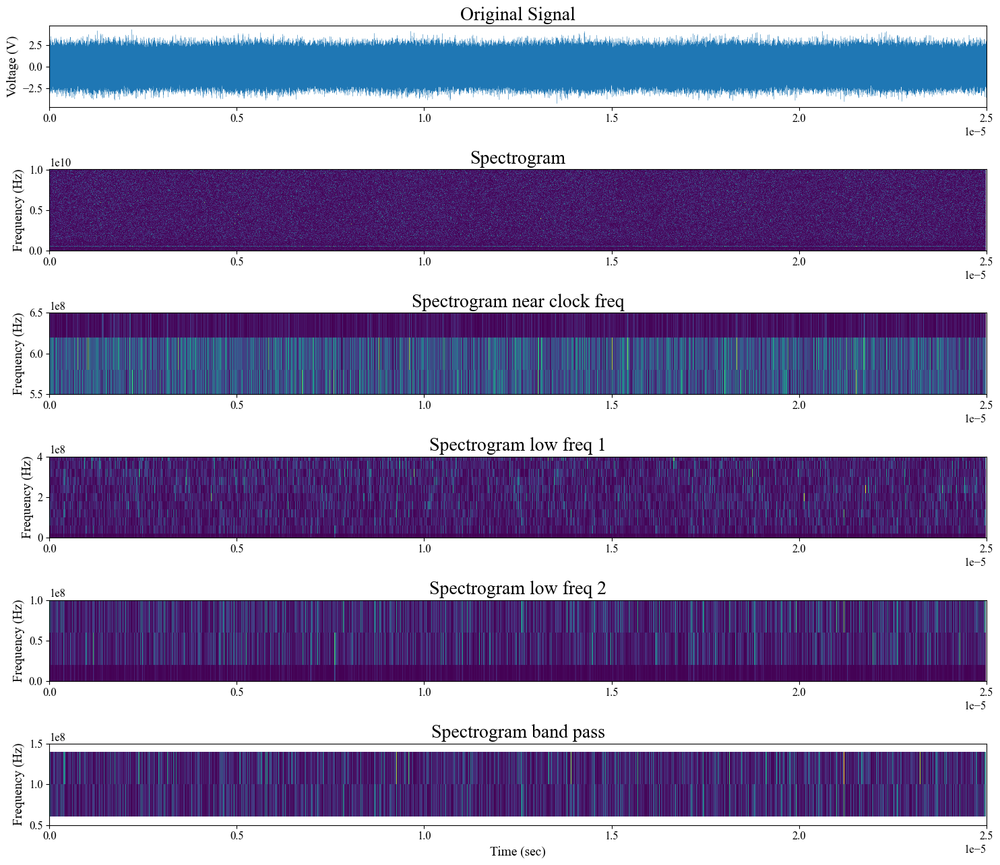

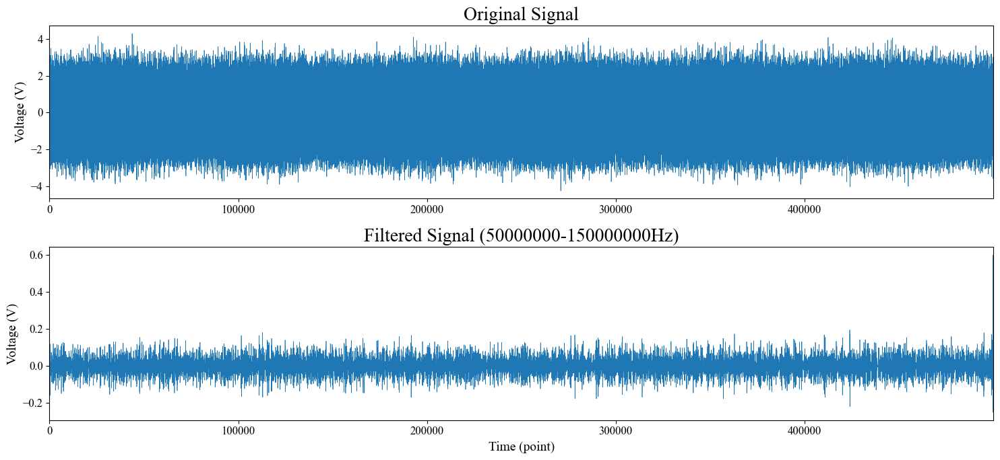

3


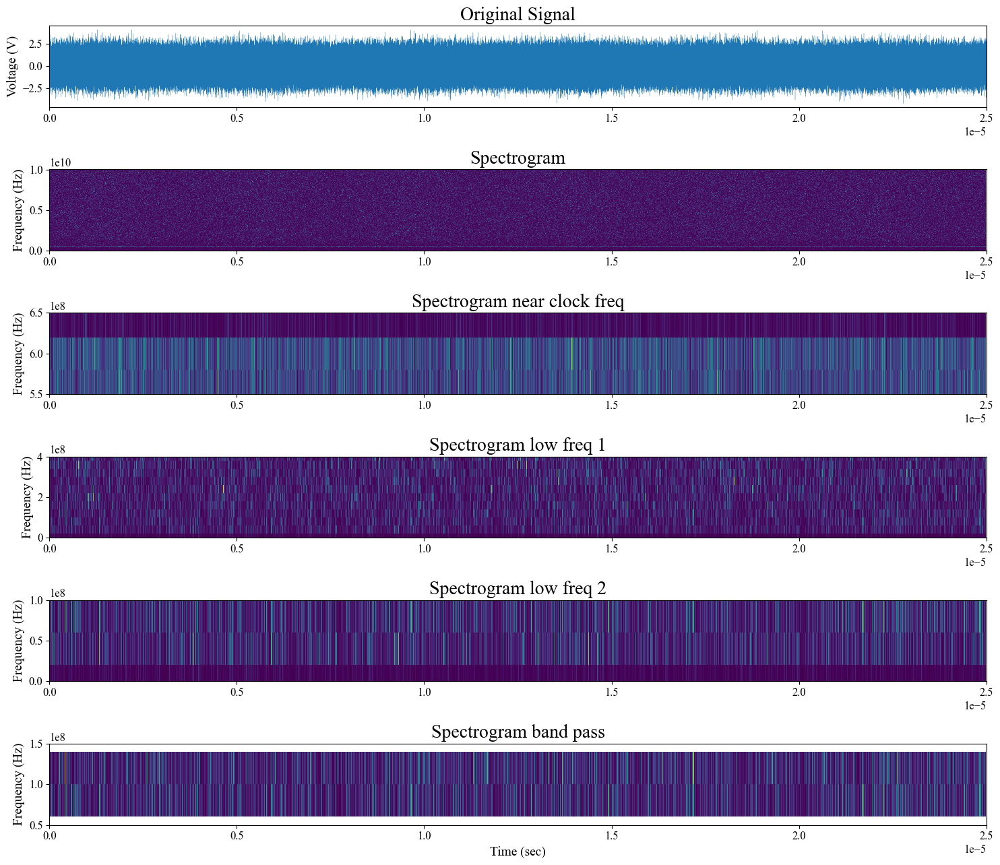

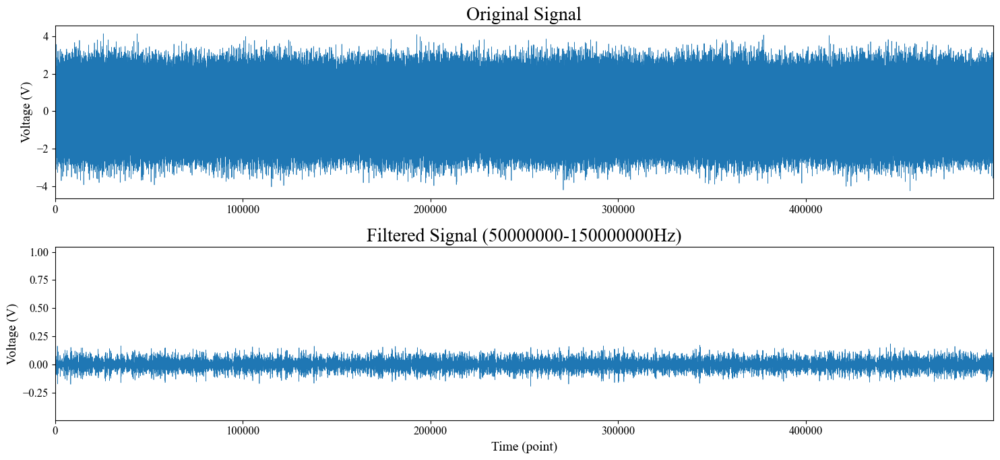

4


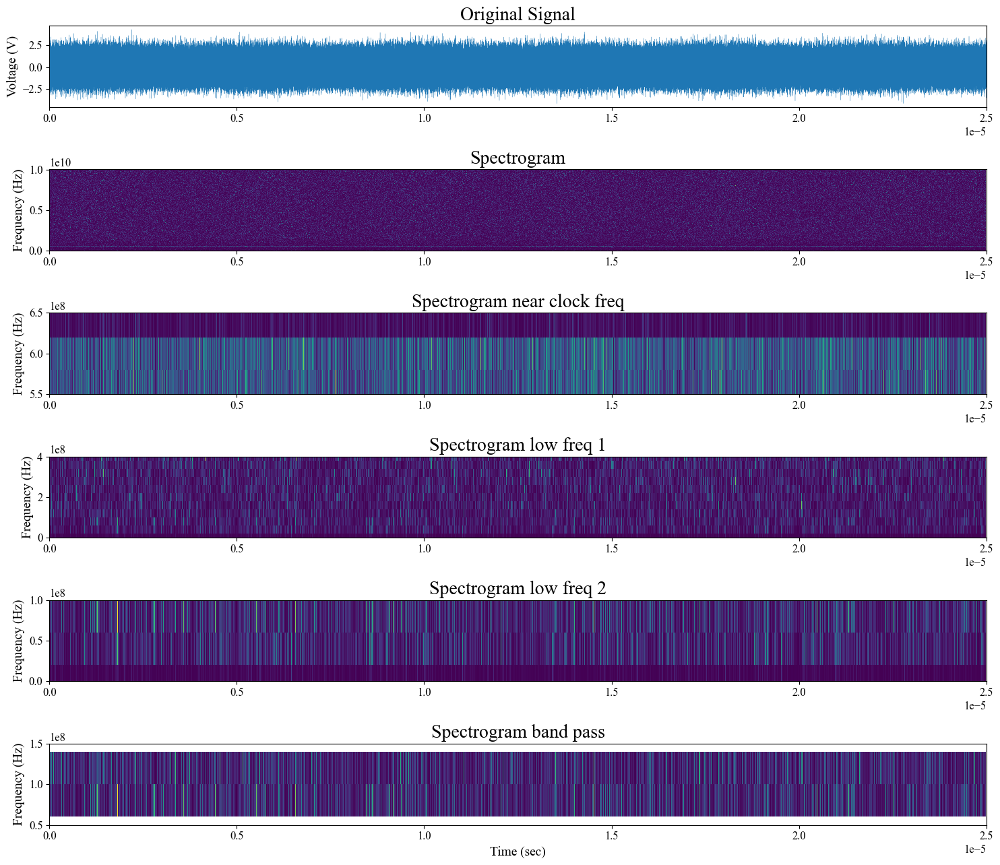

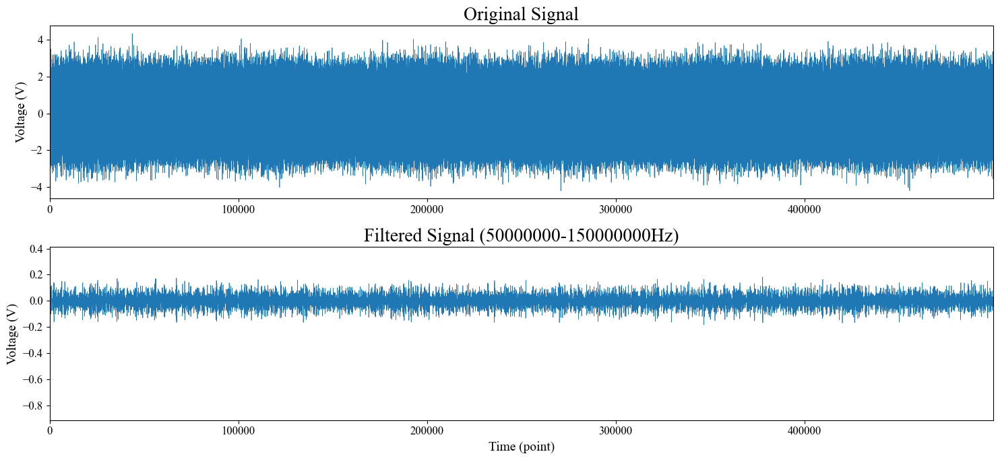

5


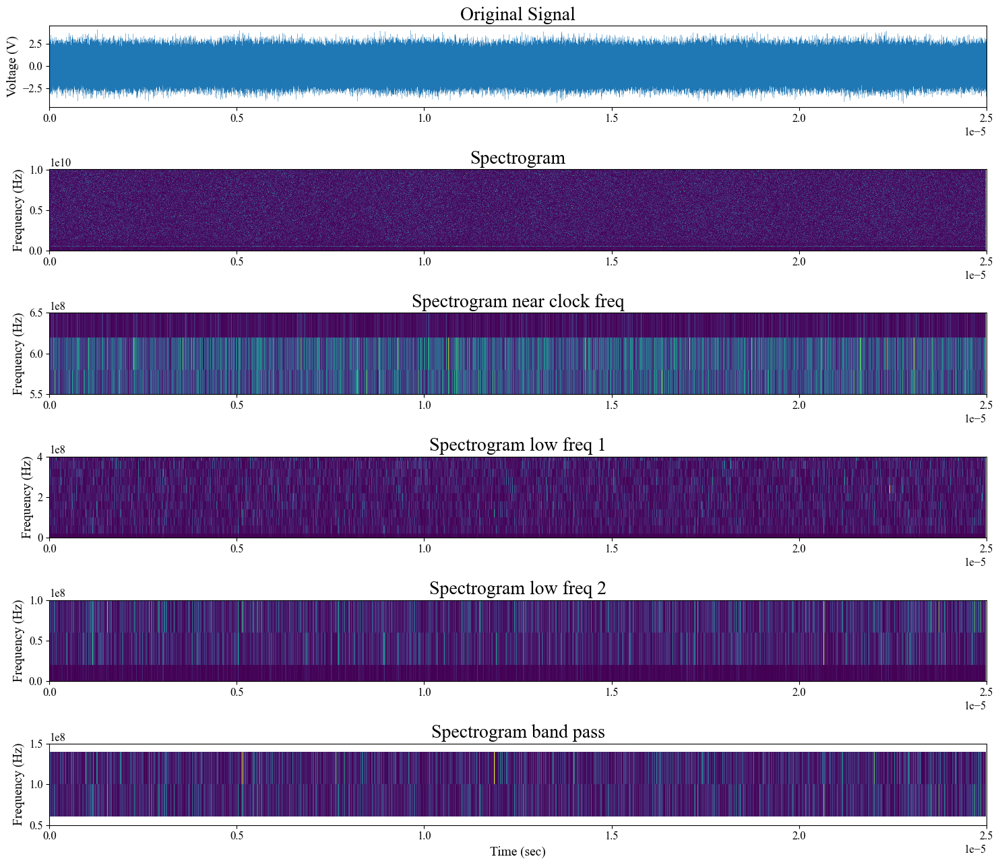

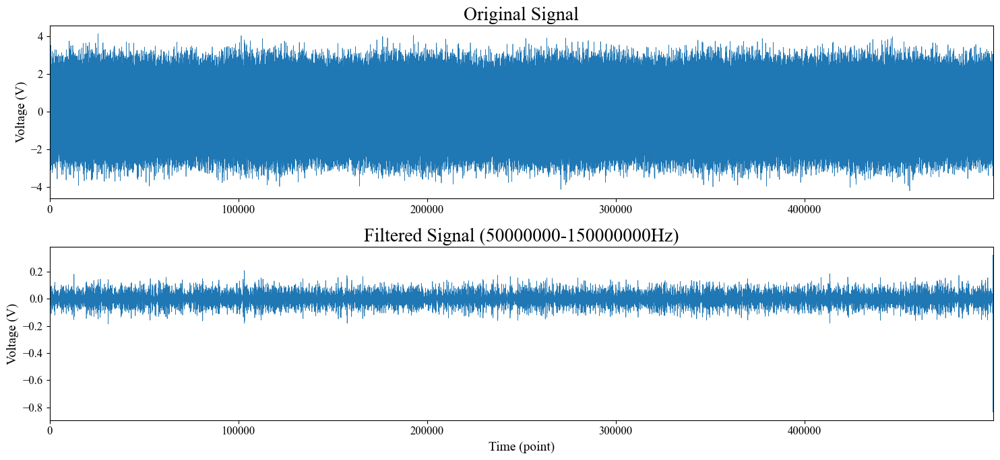

6


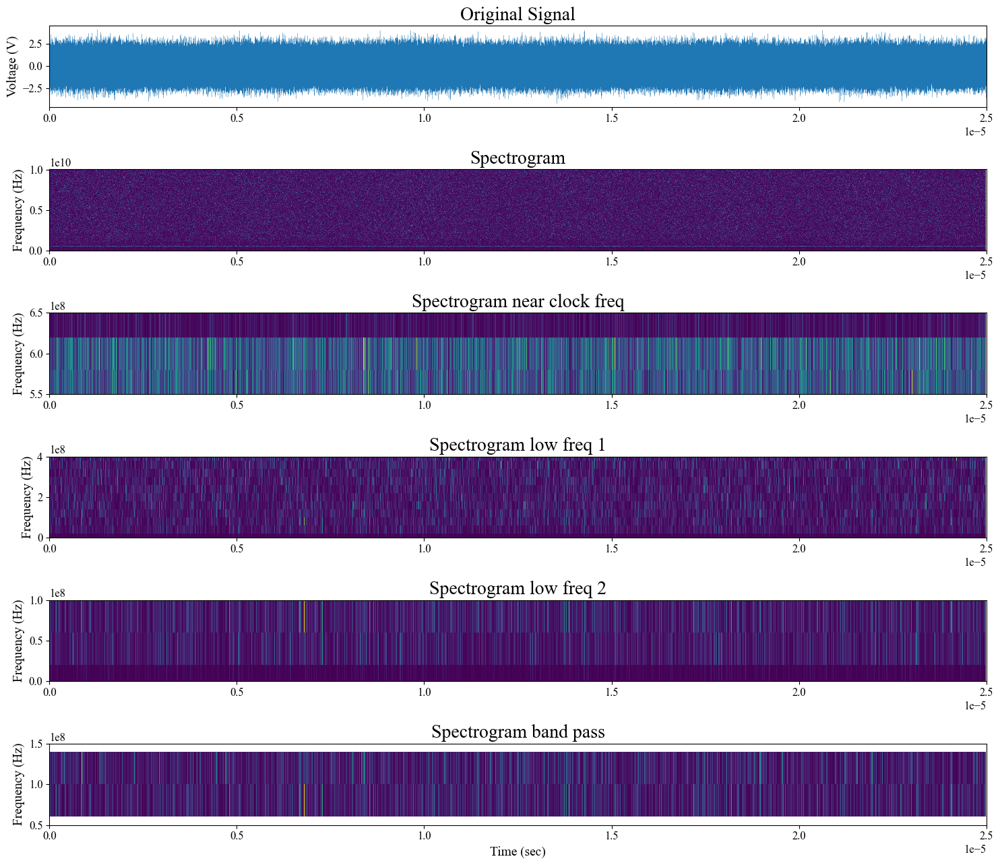

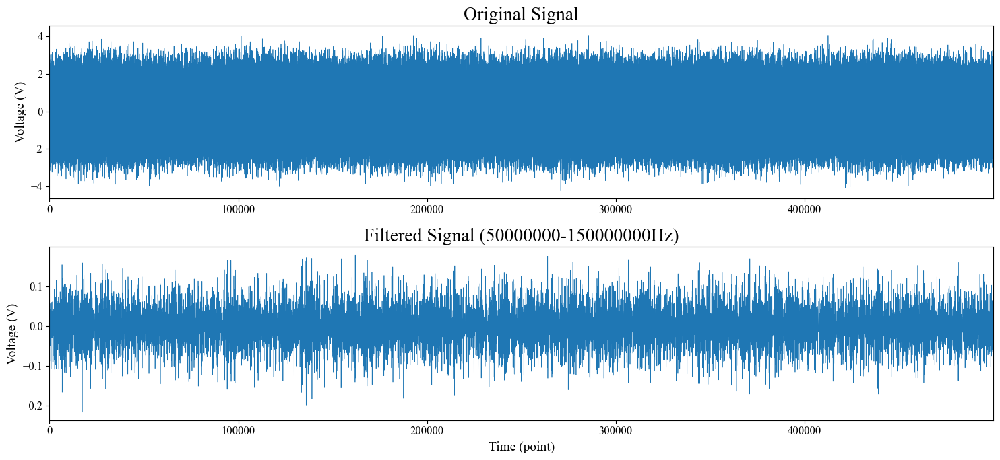

7


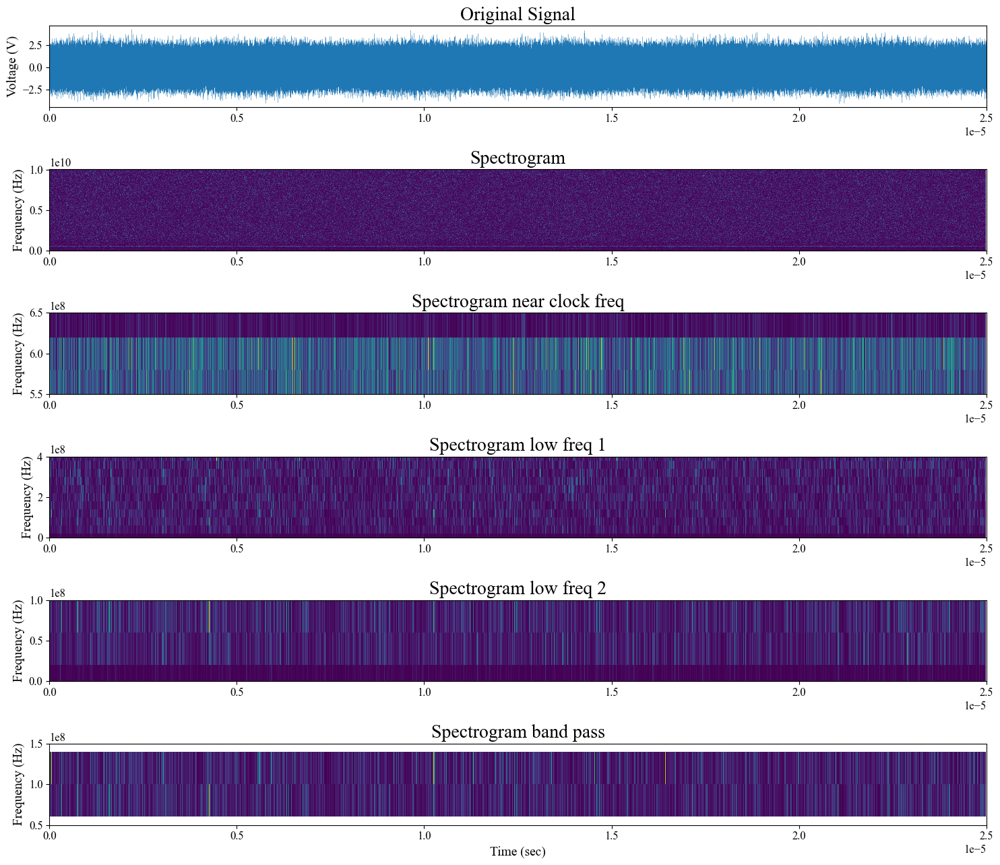

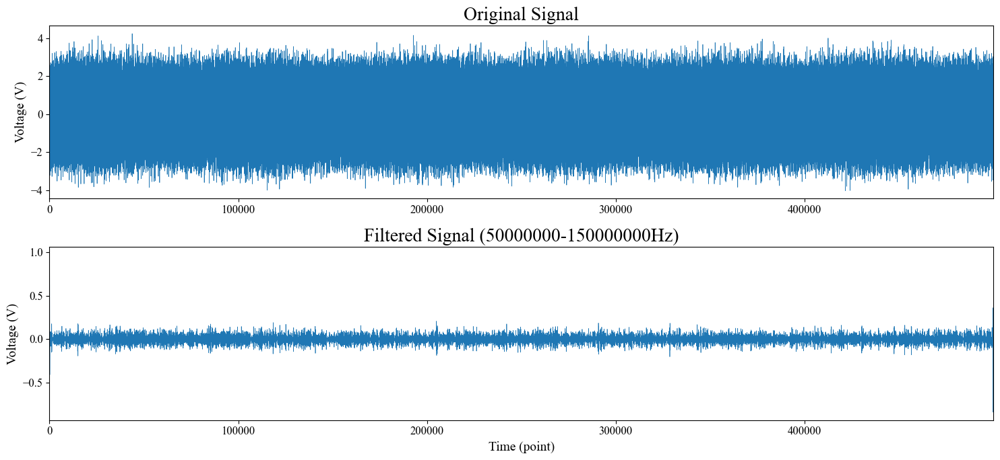

8


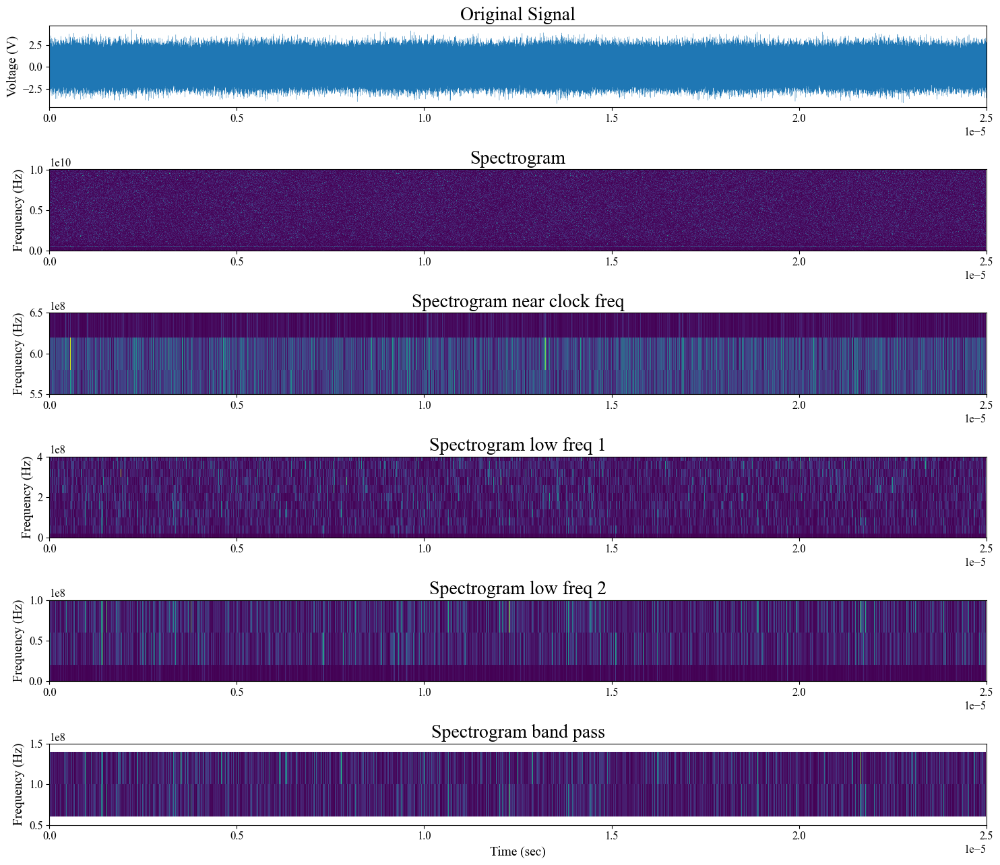

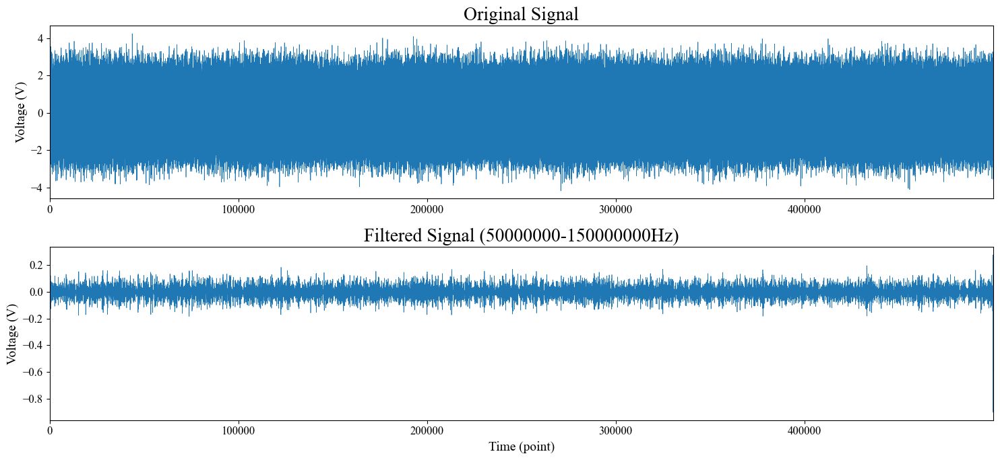

9


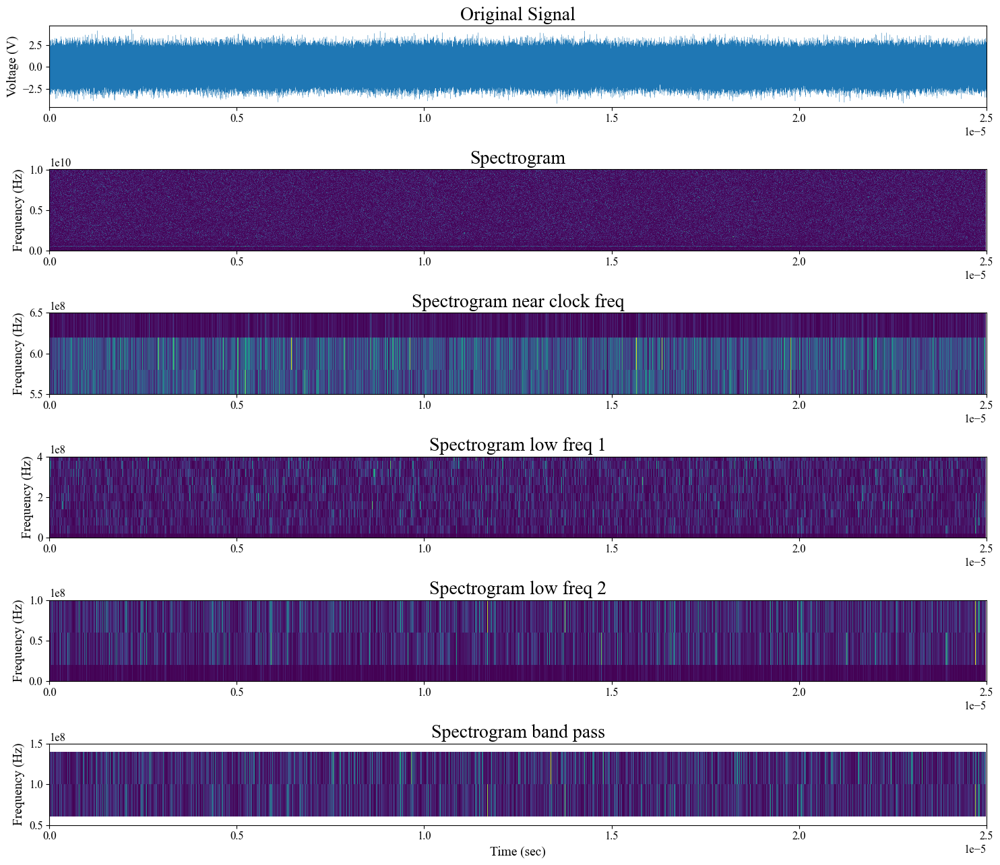

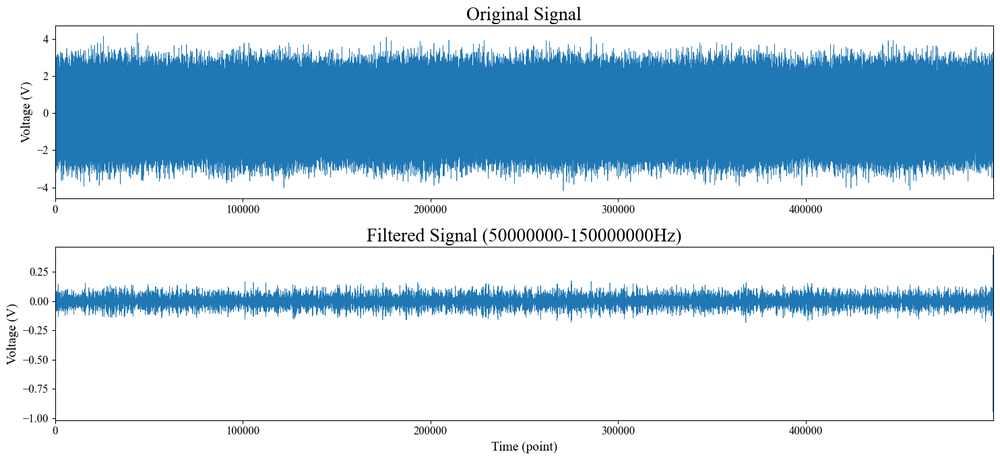

In [29]:
for traceIndex in tqdm(range(trace_index_range[0], trace_index_range[1])):
    print(traceIndex)
    trace = np.load('{}/trace_{}.npy'.format(tracePath, traceIndex))
    f, t, Sxx = signal.spectrogram(trace, fs=samplingFrequency, noverlap=noverlap, window=signal.get_window(window='hamming', Nx=windowLength))
    
    duration = trace.shape[0] / samplingFrequency
    
    plt.figure(figsize=(15, 13))
    plt.subplot(6, 1, 1)
    plt.title('Original Signal', fontsize=titleFontSize)
    plt.plot(np.linspace(0, duration, trace.shape[0]), trace, linewidth=0.2)
    plt.xlim(0, duration)
    plt.ylabel('Voltage (V)', fontsize=axisFontSize)
    
    plt.subplot(6, 1, 2)
    plt.title('Spectrogram', fontsize=titleFontSize)
    plt.pcolormesh(t, f, Sxx)
    plt.xlim(0, duration)
    plt.ylabel('Frequency (Hz)', fontsize=axisFontSize)
    
    plt.subplot(6, 1, 3)
    plt.title('Spectrogram near clock freq', fontsize=titleFontSize)
    ind1 = len(f[f<=550e6])
    ind2 = len(f[f<=650e6])
    plt.pcolormesh(t, f[ind1:ind2], Sxx[ind1:ind2, :])
    plt.xlim(0, duration)
    plt.ylim(550e6, 650e6)
    plt.ylabel('Frequency (Hz)', fontsize=axisFontSize)
    
    plt.subplot(6, 1, 4)
    plt.title('Spectrogram low freq 1', fontsize=titleFontSize)
    ind = len(f[f<=400e6])
    plt.pcolormesh(t, f[:ind], Sxx[:ind, :])
    plt.xlim(0, duration)
    plt.ylim(0, 400e6)
    plt.ylabel('Frequency (Hz)', fontsize=axisFontSize)
    
    plt.subplot(6, 1, 5)
    plt.title('Spectrogram low freq 2', fontsize=titleFontSize)
    ind = len(f[f<=100e6])
    plt.pcolormesh(t, f[:ind], Sxx[:ind, :])
    plt.xlim(0, duration)
    plt.ylim(0, 100e6)
    plt.ylabel('Frequency (Hz)', fontsize=axisFontSize)
             
    plt.subplot(6, 1, 6)
    plt.title('Spectrogram band pass', fontsize=titleFontSize)
    ind1 = len(f[f<bandPassFreq[0]])
    ind2 = len(f[f<=bandPassFreq[1]])
    plt.pcolormesh(t, f[ind1:ind2], Sxx[ind1:ind2, :])
    plt.xlim(0, duration)
    plt.ylim(bandPassFreq[0], bandPassFreq[1])
    plt.ylabel('Frequency (Hz)', fontsize=axisFontSize)
    
    plt.xlabel('Time (sec)', fontsize=axisFontSize)
    plt.tight_layout()
    plt.savefig('{}/spectrogram_{}.png'.format(resultFolderName, traceIndex), dpi=300, bbox_inches='tight')
    plt.show()

    #########################################################################################################
    
    filteredTrace = signal.filtfilt(b=firCoeff, a=1.0, x=trace)
        
    plt.figure(figsize=(15, 7))
    plt.subplot(2, 1, 1)
    plt.title('Original Signal', fontsize=titleFontSize)
    plt.plot(trace, linewidth=0.5)
    plt.xlim(0, trace.shape[0]-1)
    plt.ylabel('Voltage (V)', fontsize=axisFontSize)
        
    plt.subplot(2, 1, 2)
    plt.title('Filtered Signal ({}-{}Hz)'.format(bandPassFreq[0], bandPassFreq[1]), fontsize=titleFontSize)
    plt.plot(filteredTrace, linewidth=0.5)
    plt.xlim(0, trace.shape[0]-1)
    plt.ylabel('Voltage (V)', fontsize=axisFontSize)
    
    plt.xlabel('Time (point)', fontsize=axisFontSize)
    plt.tight_layout()
    plt.savefig('{}/bandPass_{}.png'.format(resultFolderName, traceIndex), dpi=300, bbox_inches='tight')
    plt.show()

# Setting Reference Trace

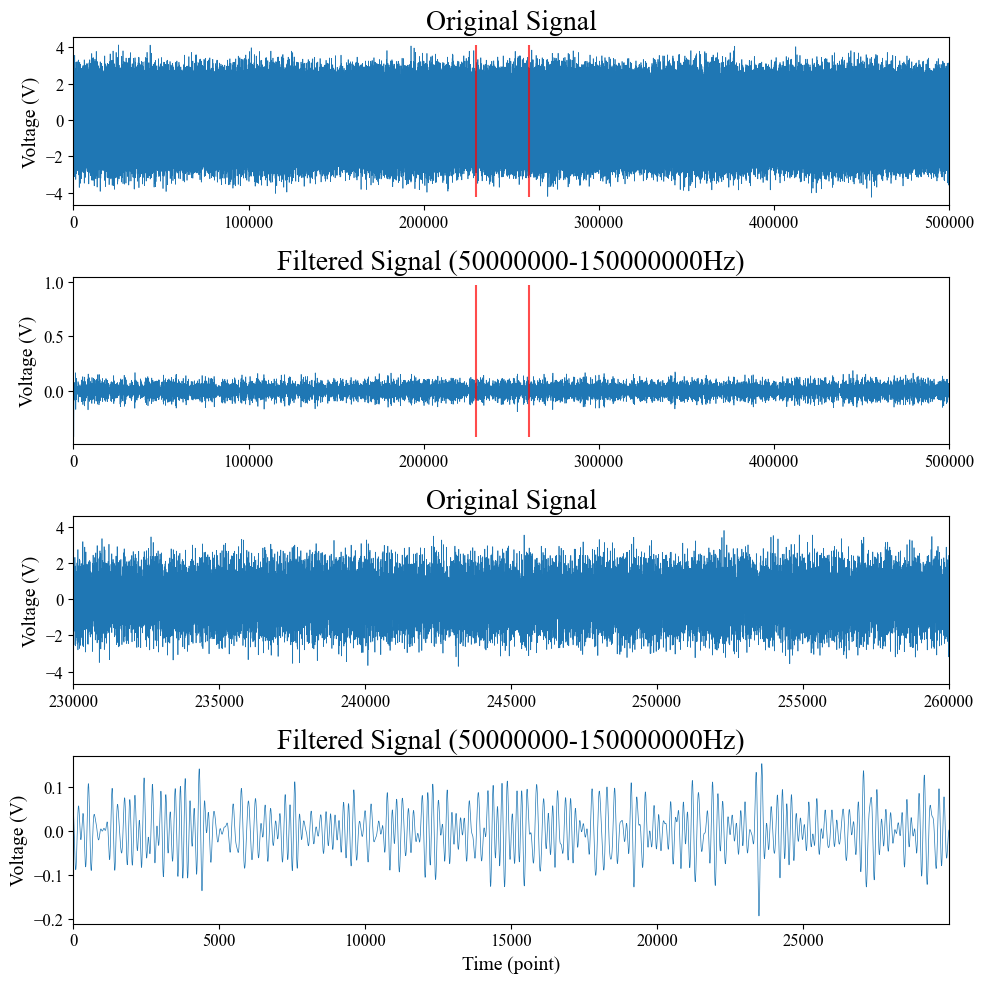

In [30]:
trace = np.load('{}/trace_{}.npy'.format(tracePath, referenceTraceIndex))
filtTrace = signal.filtfilt(b=firCoeff, a=1.0, x=trace)

refTrace = np.array(filtTrace[referenceTraceXrange[0] : referenceTraceXrange[1]], dtype=np.float32)

plt.figure(figsize=(10, 10))
plt.subplot(4, 1, 1)
plt.title('Original Signal', fontsize=titleFontSize)
plt.plot(trace, linewidth=0.5)
plt.vlines(referenceTraceXrange[0], np.min(trace), np.max(trace), color='r', alpha=0.7)
plt.vlines(referenceTraceXrange[1], np.min(trace), np.max(trace), color='r', alpha=0.7)
plt.xlim(0, len(trace))
plt.ylabel('Voltage (V)', fontsize=axisFontSize)
    
plt.subplot(4, 1, 2)
plt.title('Filtered Signal ({}-{}Hz)'.format(bandPassFreq[0], bandPassFreq[1]), fontsize=titleFontSize)
plt.plot(filtTrace, linewidth=0.5)
plt.vlines(referenceTraceXrange[0], np.min(filtTrace), np.max(filtTrace), color='r', alpha=0.7)
plt.vlines(referenceTraceXrange[1], np.min(filtTrace), np.max(filtTrace), color='r', alpha=0.7)
plt.xlim(0, len(trace))
plt.ylabel('Voltage (V)', fontsize=axisFontSize)

plt.subplot(4, 1, 3)
plt.title('Original Signal', fontsize=titleFontSize)
plt.plot(trace, linewidth=0.5)
plt.xlim(referenceTraceXrange[0], referenceTraceXrange[1])
plt.ylabel('Voltage (V)', fontsize=axisFontSize)
    
plt.subplot(4, 1, 4)
plt.title('Filtered Signal ({}-{}Hz)'.format(bandPassFreq[0], bandPassFreq[1]), fontsize=titleFontSize)
plt.plot(refTrace, linewidth=0.5)
plt.xlim(0, len(refTrace)-1)
plt.ylabel('Voltage (V)', fontsize=axisFontSize)

plt.xlabel('Time (point)', fontsize=axisFontSize)
plt.tight_layout()
plt.savefig('{}/criterionTrace.png'.format(resultFolderName), dpi=300, bbox_inches='tight')
plt.show()

# Test Criterion

In [31]:
def getCorrs(trace, refTrace, refTraceSum, refTraceSquSum):
    squTrace = np.square(trace)
    traceLen = refTrace.shape[0]

    # Phase 1
    corrs = []
    maxCorr      = 0
    maxCorrIndex = 0
    for pointIndex in range(0, trace.shape[0] - refTrace.shape[0]):
        traceSum    = np.sum(trace[pointIndex:pointIndex+traceLen])
        traceSquSum = np.sum(squTrace[pointIndex:pointIndex+traceLen])
        corr = (traceLen *  np.sum(trace[pointIndex:pointIndex+traceLen] * refTrace) - traceSum * refTraceSum) / (math.sqrt(traceLen * traceSquSum - traceSum ** 2) * math.sqrt(traceLen * refTraceSquSum - refTraceSum ** 2))
        corrs.append(corr)
        if maxCorr < corr:
            maxCorr = corr
            maxCorrIndex = pointIndex
            
    return maxCorr, maxCorrIndex, corrs

  0%|          | 0/10 [00:00<?, ?it/s]

Trace  0	Correlation: 0.262	(point:  309933)	Over criterion: False


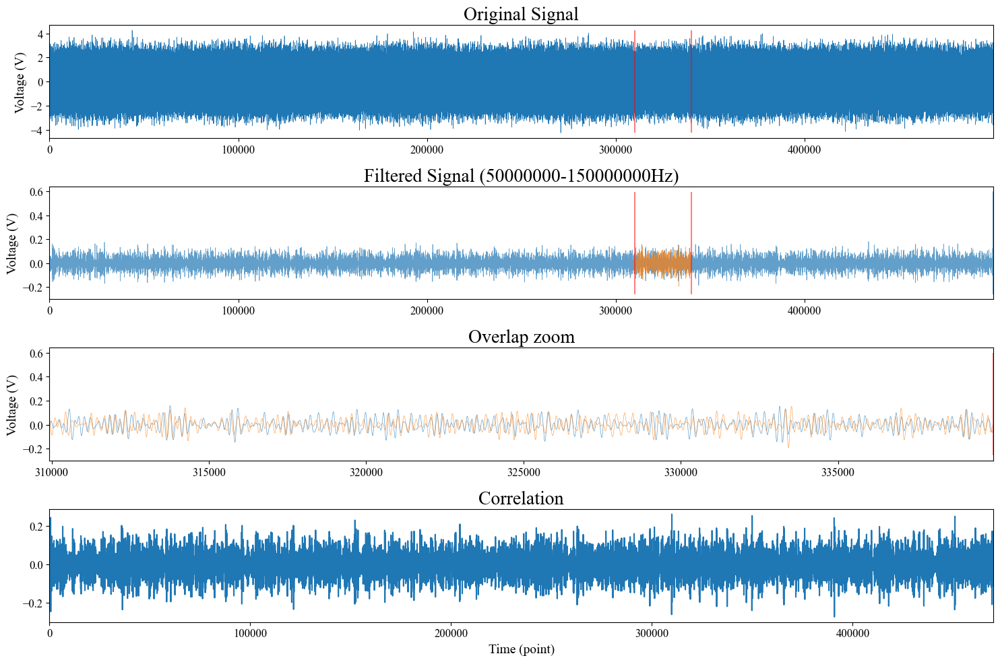

Trace  1	Correlation: 0.256	(point:  330603)	Over criterion: False


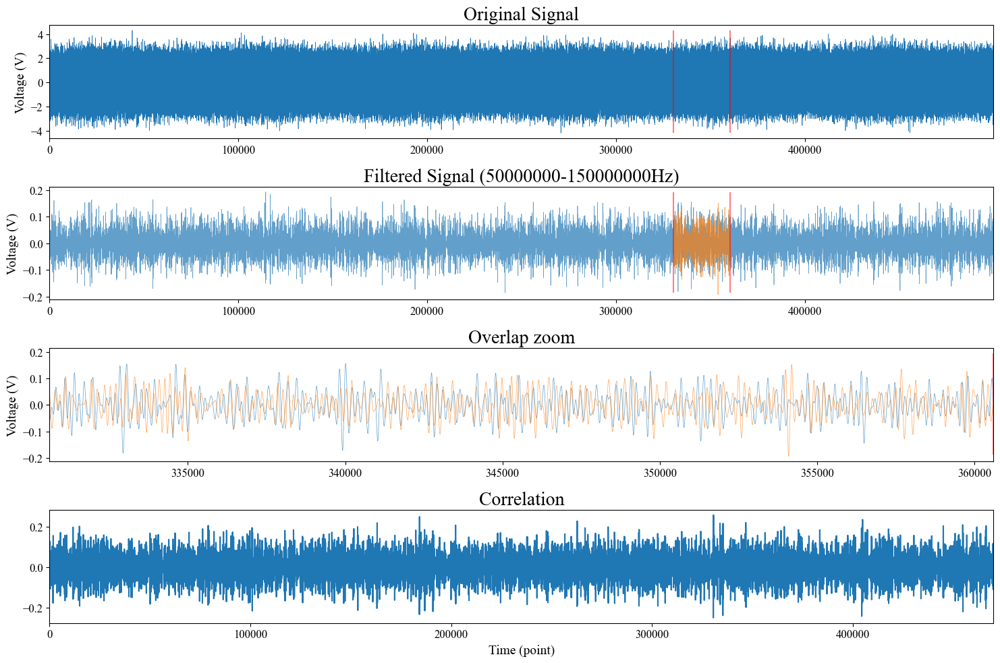

Trace  2	Correlation: 0.257	(point:  232026)	Over criterion: False


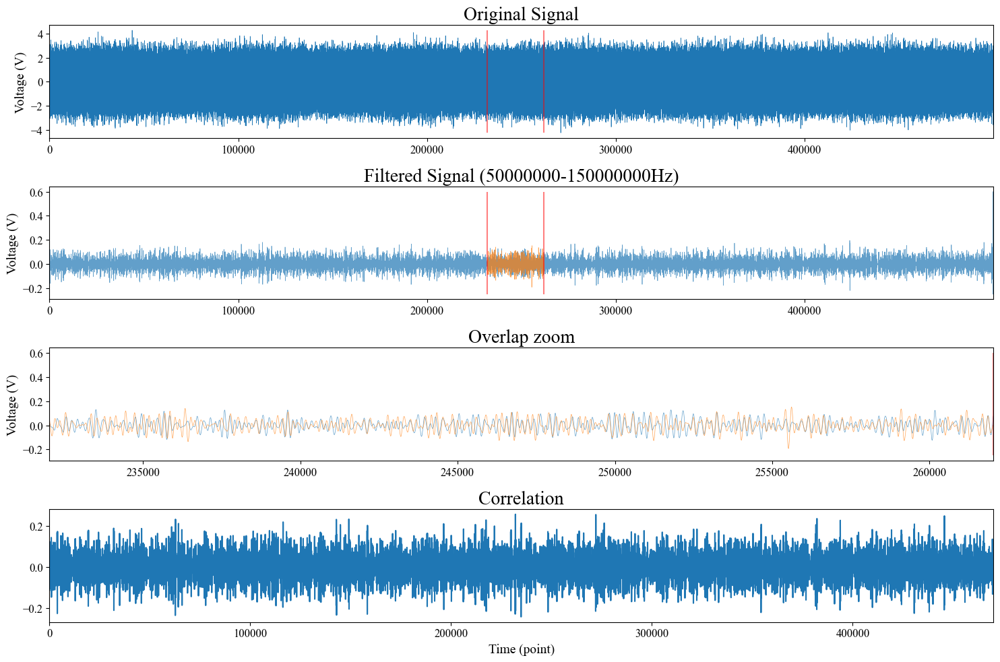

Trace  3	Correlation: 1.000	(point:  230000)	Over criterion: True


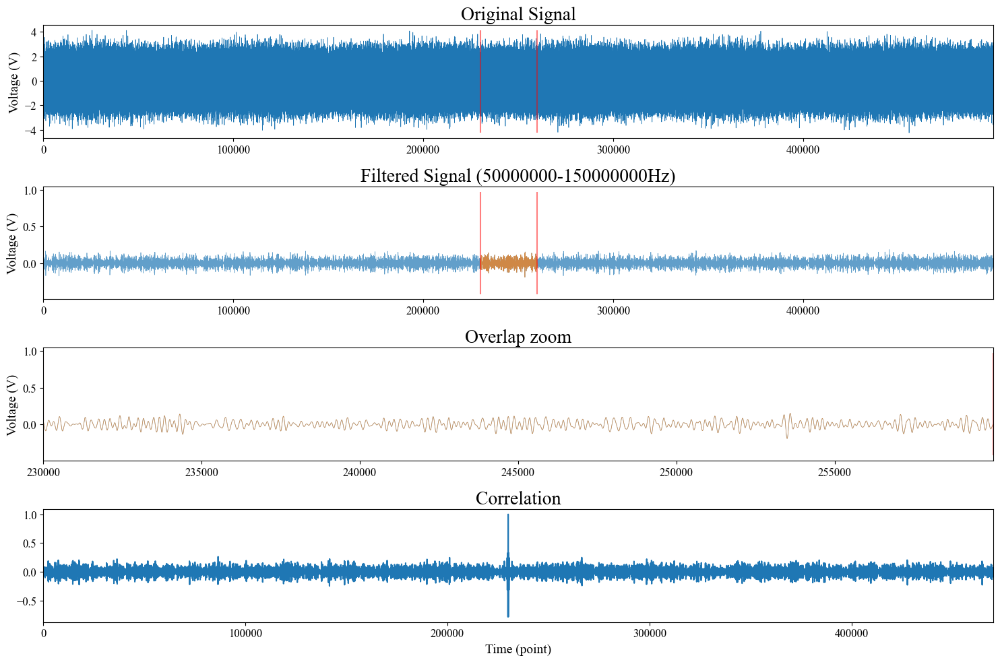

Trace  4	Correlation: 0.237	(point:  381950)	Over criterion: False


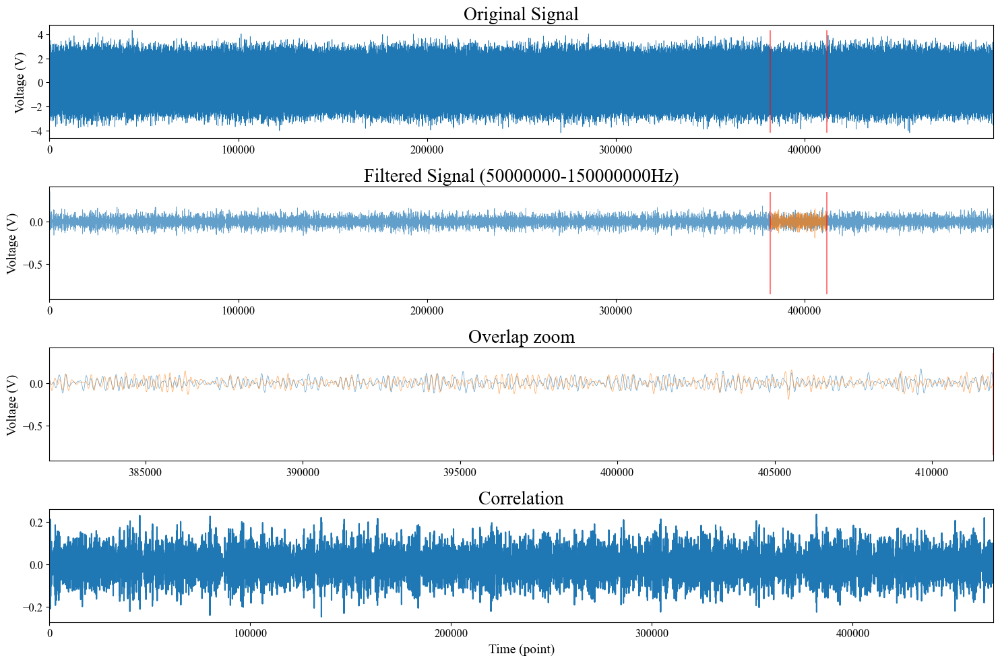

Trace  5	Correlation: 0.287	(point:  215509)	Over criterion: False


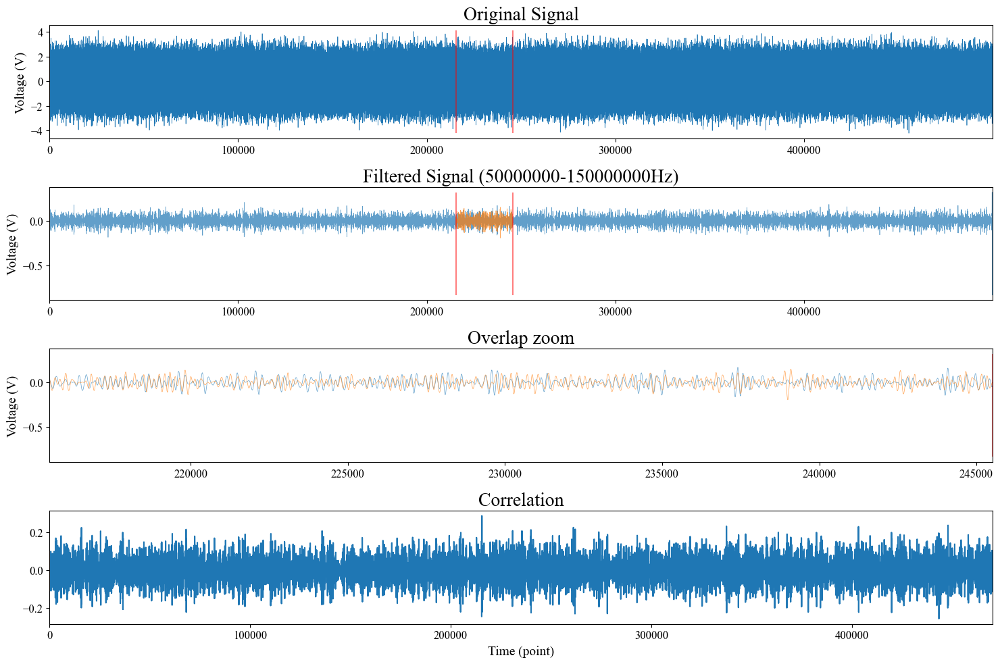

Trace  6	Correlation: 0.237	(point:  379292)	Over criterion: False


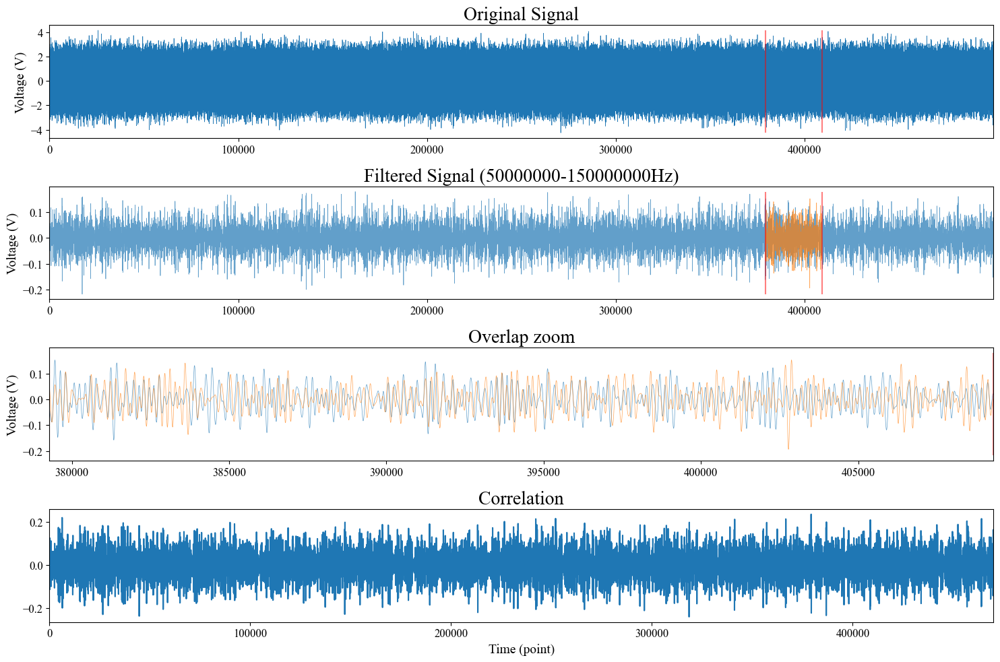

Trace  7	Correlation: 0.228	(point:  398155)	Over criterion: False


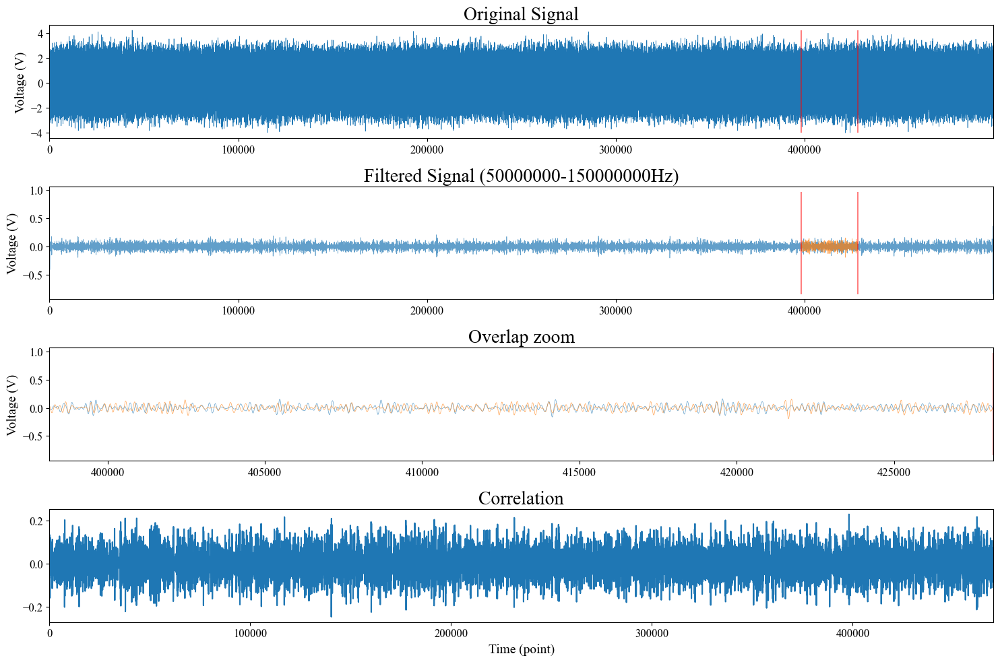

Trace  8	Correlation: 0.272	(point:   79104)	Over criterion: False


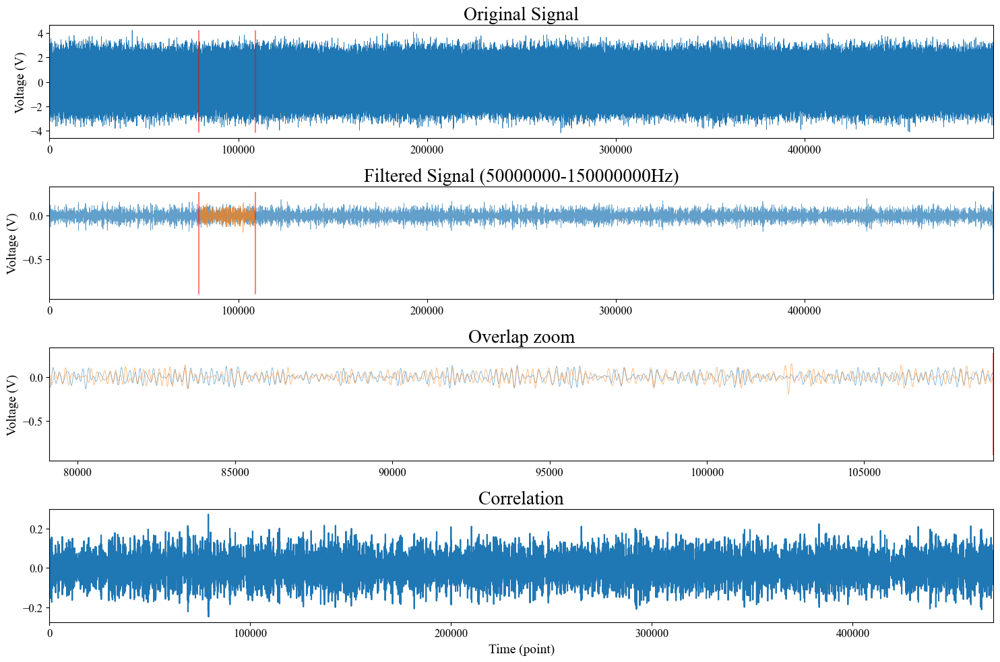

Trace  9	Correlation: 0.256	(point:   81043)	Over criterion: False


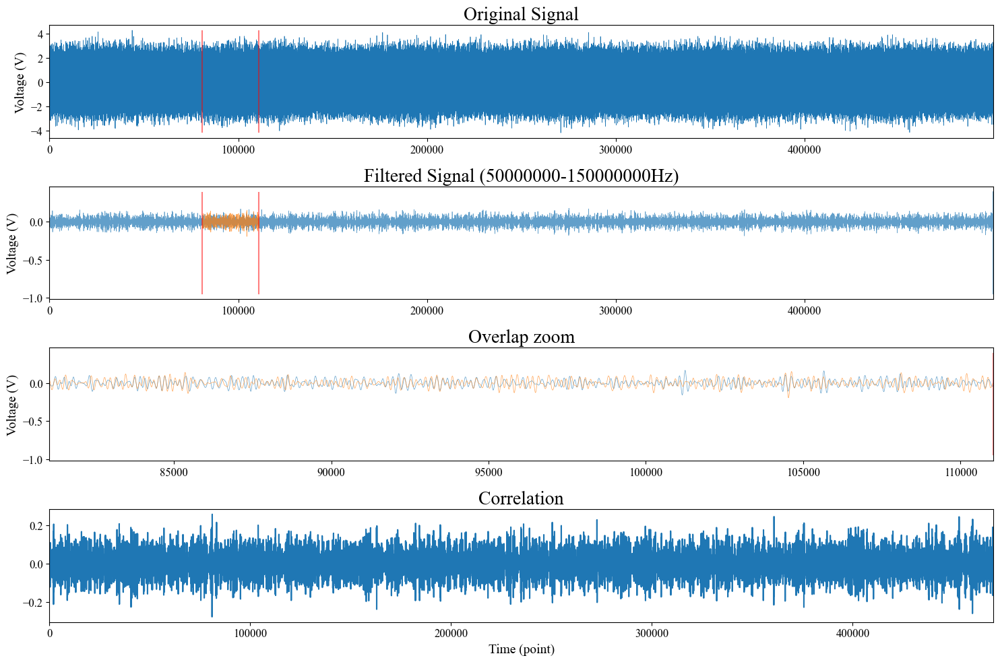

1


In [32]:
refTrace = np.load('{}/trace_{}.npy'.format(tracePath, referenceTraceIndex))
filteredRefTrace = np.array(signal.filtfilt(b=firCoeff, a=1.0, x=refTrace), dtype=np.float32)
refTraceEnvelope = filteredRefTrace[referenceTraceXrange[0] : referenceTraceXrange[1]]

cntOverCriterion = 0
refTraceSum     = np.sum(refTraceEnvelope)
refTraceSquSum  = np.sum(np.square(refTraceEnvelope))
for traceIndex in tqdm(range(0, 10)):
    trace = np.load('{}/trace_{}.npy'.format(tracePath, traceIndex))
    filteredTrace = np.array(signal.filtfilt(b=firCoeff, a=1.0, x=trace), dtype=np.float32)
    traceEnvelope = filteredTrace
    #traceEnvelope = np.abs(signal.hilbert(filteredTrace))
    
    maxCorr, maxCorrIndex, corrs = getCorrs(traceEnvelope, refTraceEnvelope, refTraceSum, refTraceSquSum)
    print('Trace {:2d}\tCorrelation: {:.3f}\t(point: {:7d})\tOver criterion: {}'.format(traceIndex, maxCorr, maxCorrIndex, maxCorr >= correlationCriterion))
    cntOverCriterion += maxCorr >= correlationCriterion
    
    plt.figure(figsize=(15, 10))
    plt.subplot(4, 1, 1)
    plt.title('Original Signal', fontsize=titleFontSize)
    plt.plot(trace, linewidth=0.5)
    plt.xlim(0, trace.shape[0]-1)
    plt.ylabel('Voltage (V)', fontsize=axisFontSize)
    plt.vlines(maxCorrIndex,                           np.min(trace), np.max(trace), color='r', alpha=0.5)
    plt.vlines(maxCorrIndex+refTraceEnvelope.shape[0], np.min(trace), np.max(trace), color='r', alpha=0.5)
        
    plt.subplot(4, 1, 2)
    plt.title('Filtered Signal ({}-{}Hz)'.format(bandPassFreq[0], bandPassFreq[1]), fontsize=titleFontSize)
    plt.plot(filteredTrace, linewidth=0.5, alpha=0.7)
    plt.plot(np.arange(maxCorrIndex, maxCorrIndex+refTraceEnvelope.shape[0]), filteredRefTrace[referenceTraceXrange[0] : referenceTraceXrange[1]], linewidth=0.5, alpha=0.7)
    plt.xlim(0, filteredTrace.shape[0]-1)
    plt.ylabel('Voltage (V)', fontsize=axisFontSize)
    plt.vlines(maxCorrIndex,                           np.min(filteredTrace), np.max(filteredTrace), color='r', alpha=0.5)
    plt.vlines(maxCorrIndex+refTraceEnvelope.shape[0], np.min(filteredTrace), np.max(filteredTrace), color='r', alpha=0.5)

    plt.subplot(4, 1, 3)
    plt.title('Overlap zoom'.format(bandPassFreq[0], bandPassFreq[1]), fontsize=titleFontSize)
    plt.plot(traceEnvelope, linewidth=0.5, alpha=0.7)
    plt.plot(np.arange(maxCorrIndex, maxCorrIndex+refTraceEnvelope.shape[0]), refTraceEnvelope, linewidth=0.5, alpha=0.7)
    plt.xlim(maxCorrIndex,  maxCorrIndex+refTraceEnvelope.shape[0]-1)
    plt.ylabel('Voltage (V)', fontsize=axisFontSize)
    plt.vlines(maxCorrIndex,                           np.min(traceEnvelope), np.max(traceEnvelope), color='r', alpha=0.5)
    plt.vlines(maxCorrIndex+refTraceEnvelope.shape[0], np.min(traceEnvelope), np.max(traceEnvelope), color='r', alpha=0.5)

    plt.subplot(4, 1, 4)
    plt.title('Correlation'.format(bandPassFreq[0], bandPassFreq[1]), fontsize=titleFontSize)
    plt.plot(corrs)
    plt.xlim(0, len(corrs)-1)
    
    plt.xlabel('Time (point)', fontsize=axisFontSize)
    plt.tight_layout()
    plt.savefig('{}/criterionTest_{}.png'.format(resultFolderName, traceIndex), dpi=300, bbox_inches='tight')
    plt.show()
print(cntOverCriterion)

# Alignment

In [47]:
def getCorrs(trace, refTrace, refTraceSum, refTraceSquSum, jump=100):
    squTrace = np.square(trace)
    traceLen = refTrace.shape[0]

    # Phase 1
    maxCorr      = 0
    maxCorrIndex = 0
    for pointIndex in range(0, trace.shape[0] - refTrace.shape[0], jump):
        traceSum    = np.sum(trace[pointIndex:pointIndex+traceLen])
        traceSquSum = np.sum(squTrace[pointIndex:pointIndex+traceLen])
        corr = abs((traceLen *  np.sum(trace[pointIndex:pointIndex+traceLen] * refTrace) - traceSum * refTraceSum) / (math.sqrt(traceLen * traceSquSum - traceSum ** 2) * math.sqrt(traceLen * refTraceSquSum - refTraceSum ** 2)))
        if maxCorr < corr:
            maxCorr = corr
            maxCorrIndex = pointIndex

    # Phase 2
    for pointIndex in range(maxCorrIndex, min(maxCorrIndex+jump, trace.shape[0] - refTrace.shape[0])):
        traceSum    = np.sum(trace[pointIndex:pointIndex+traceLen])
        traceSquSum = np.sum(squTrace[pointIndex:pointIndex+traceLen])
        corr = abs((traceLen *  np.sum(trace[pointIndex:pointIndex+traceLen] * refTrace) - traceSum * refTraceSum) / (math.sqrt(traceLen * traceSquSum - traceSum ** 2) * math.sqrt(traceLen * refTraceSquSum - refTraceSum ** 2)))
        if maxCorr < corr:
            maxCorr = corr
            maxCorrIndex = pointIndex
            
    return maxCorr, maxCorrIndex

In [57]:
def getCorrs(trace, refTrace, refTraceSum, refTraceSquSum, bound):
    squTrace = np.square(trace)
    traceLen = refTrace.shape[0]
    # Phase 1
    maxCorr      = 0
    maxCorrIndex = 0
    for pointIndex in range(bound, trace.shape[0] - refTrace.shape[0] - bound):
        traceSum    = np.sum(trace[pointIndex:pointIndex+traceLen])
        traceSquSum = np.sum(squTrace[pointIndex:pointIndex+traceLen])
        corr = ((traceLen *  np.sum(trace[pointIndex:pointIndex+traceLen] * refTrace) - traceSum * refTraceSum) / (math.sqrt(traceLen * traceSquSum - traceSum ** 2) * math.sqrt(traceLen * refTraceSquSum - refTraceSum ** 2)))
        if maxCorr < corr:
            maxCorr = corr
            maxCorrIndex = pointIndex
    return maxCorr, maxCorrIndex

  0%|          | 0/10 [00:00<?, ?it/s]

[ 0 trace ] corr: 0.248    maxCorrIndex: 9143


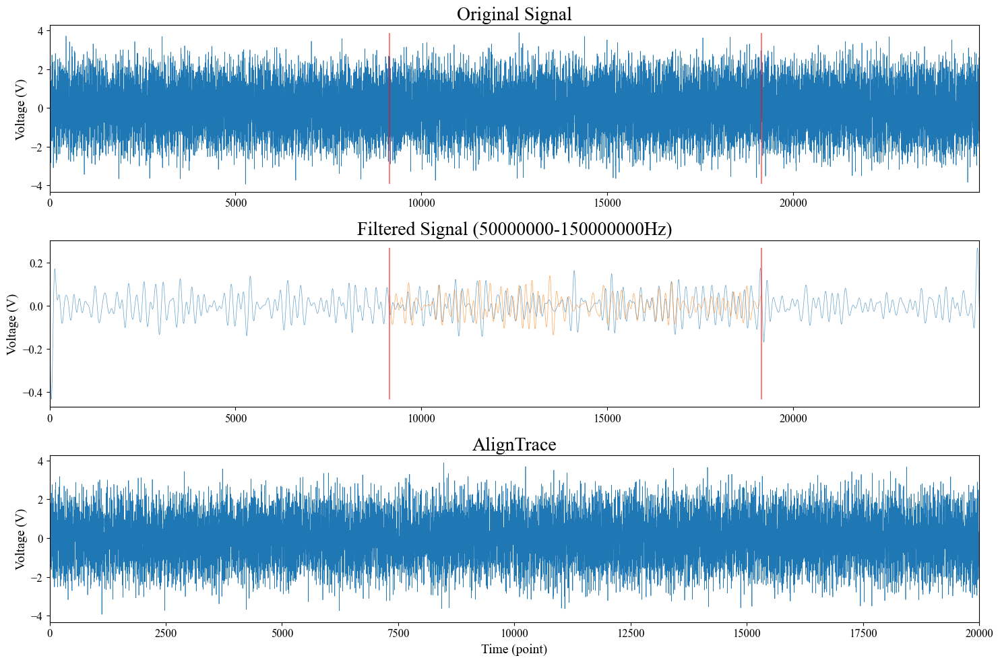

[ 2 trace ] corr: 0.271    maxCorrIndex: 7206


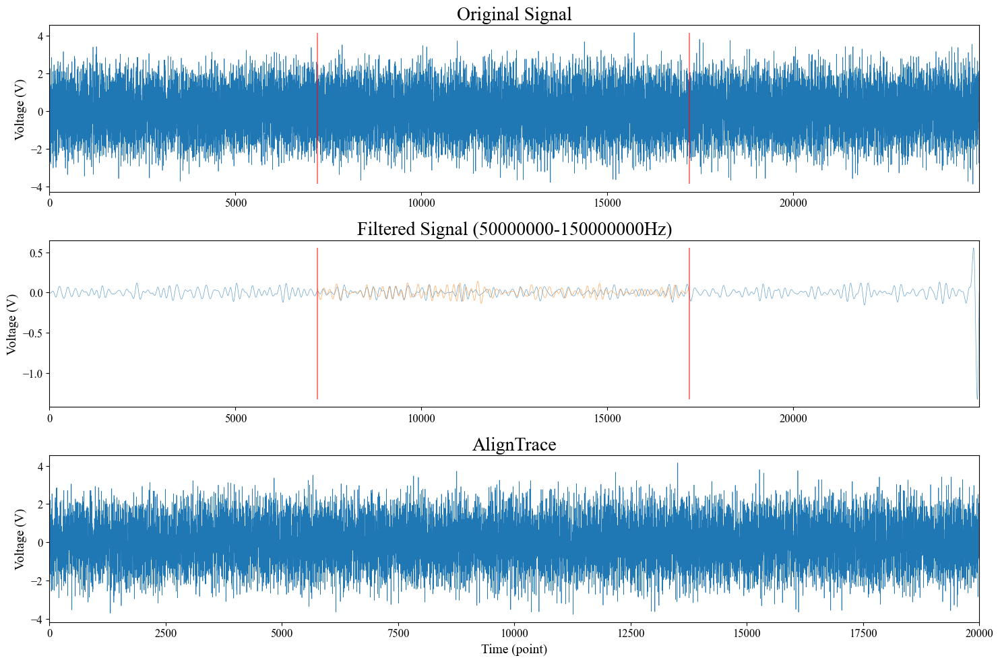

[ 3 trace ] corr: 0.259    maxCorrIndex: 5552


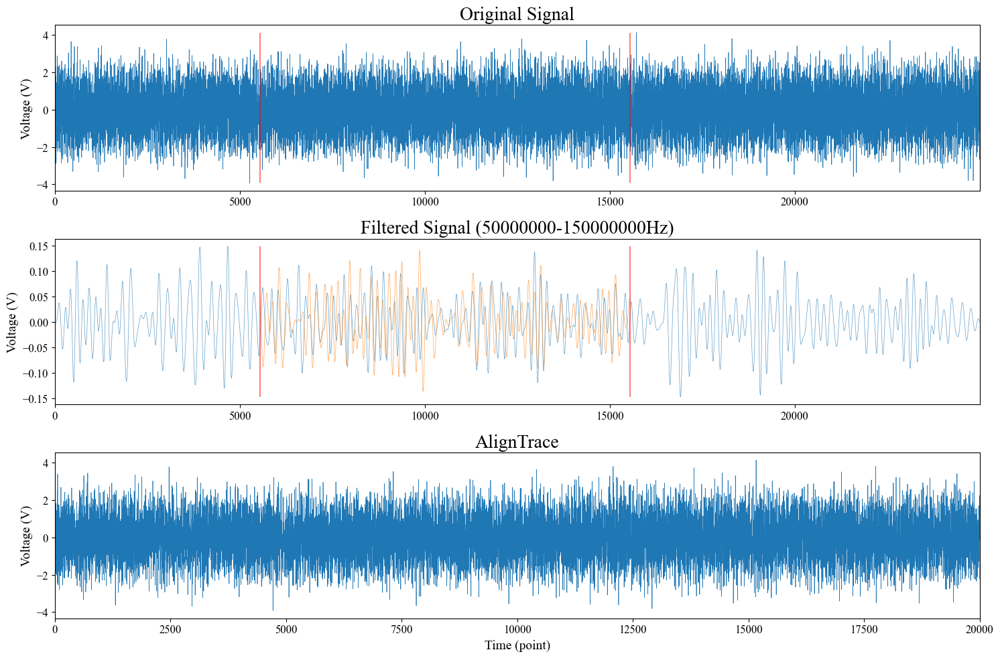

[ 4 trace ] corr: 0.396    maxCorrIndex: 9225


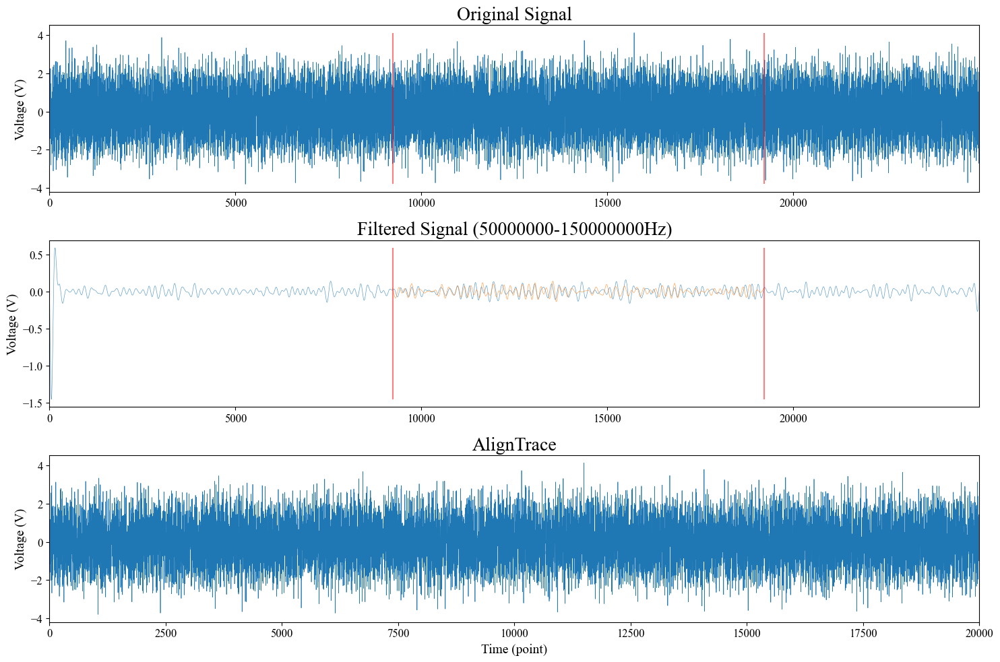

[ 5 trace ] corr: 0.358    maxCorrIndex: 5881


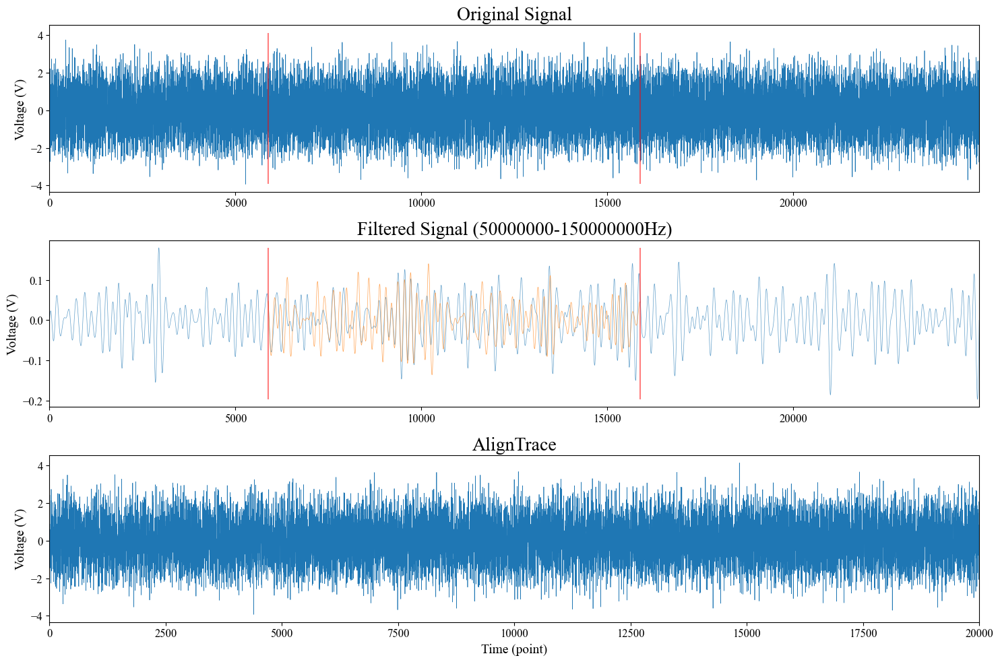

[ 6 trace ] corr: 0.252    maxCorrIndex: 7551


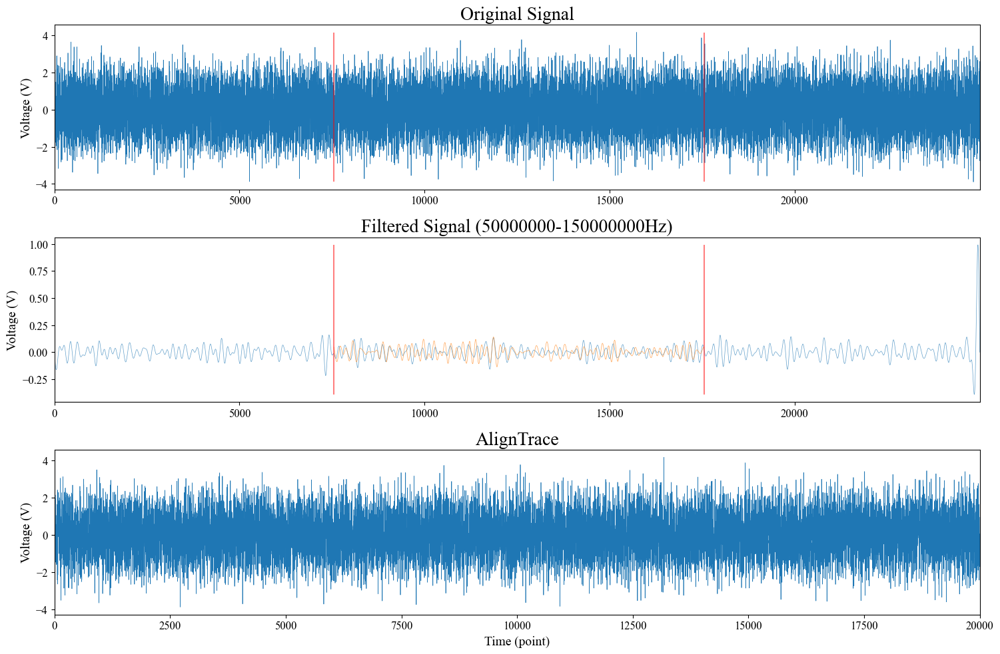

[ 7 trace ] corr: 0.280    maxCorrIndex: 9141


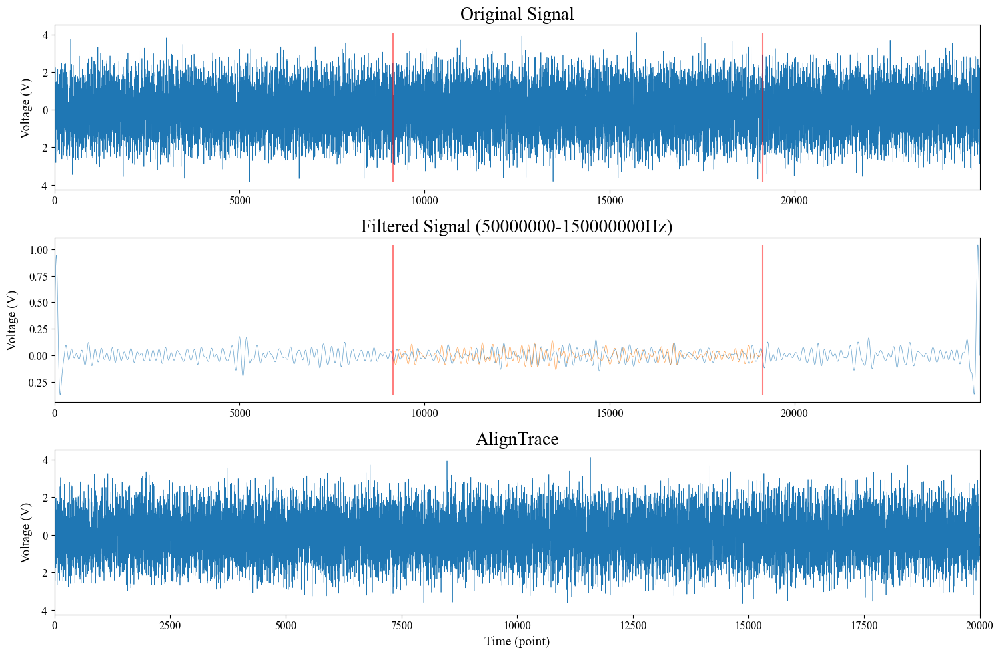

[ 8 trace ] corr: 0.262    maxCorrIndex: 7146


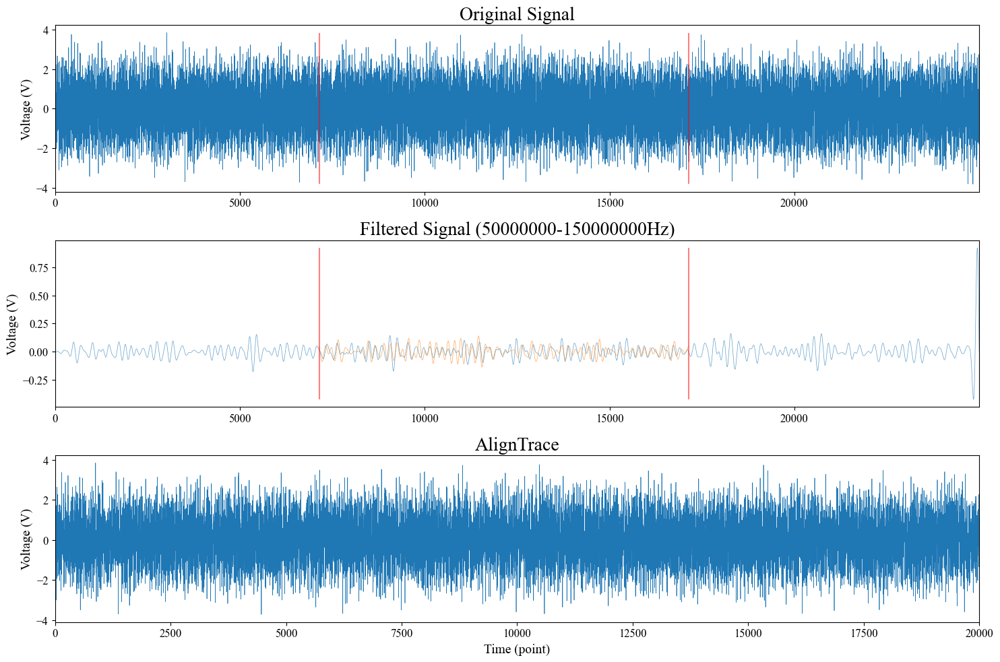

[ 9 trace ] corr: 0.234    maxCorrIndex: 6229


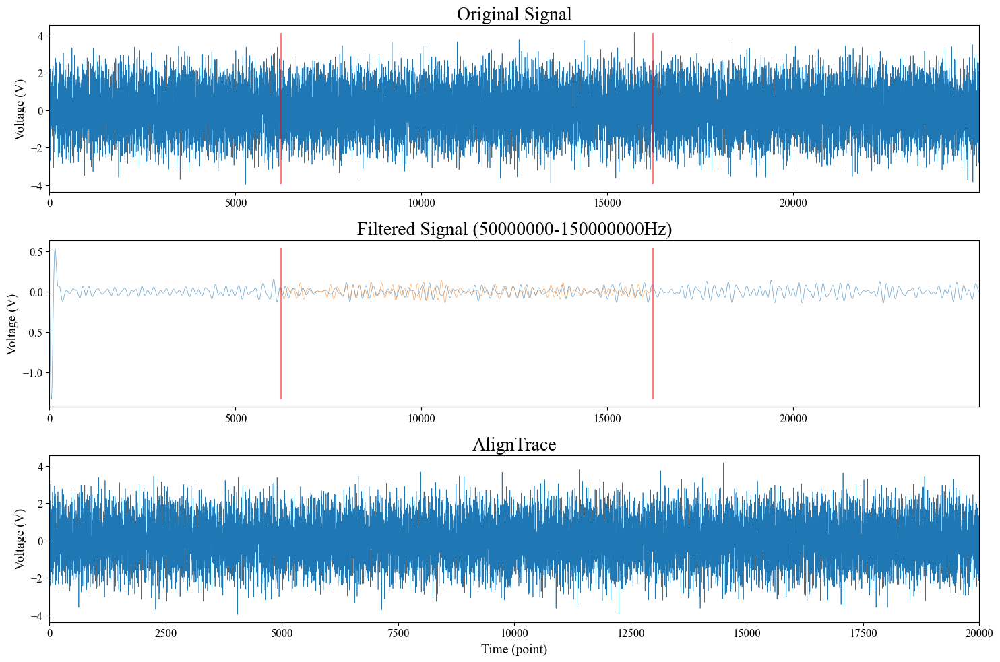

In [68]:
refTrace = np.load('{}/trace_{}.npy'.format(tracePath, referenceTraceIndex))
filteredRefTrace = np.array(signal.filtfilt(b=firCoeff, a=1.0, x=refTrace), dtype=np.float32)
#filteredRefTrace = np.abs(signal.hilbert(filteredRefTrace))
filteredRefTrace = filteredRefTrace[referenceTraceXrange[0] : referenceTraceXrange[1]]

refTraceSum     = np.sum(filteredRefTrace)
refTraceSquSum  = np.sum(np.square(filteredRefTrace))

alignedIndex = 0

for traceIndex in tqdm(range(traceNum)):
    trace = np.load('{}/trace_{}.npy'.format(tracePath, traceIndex))[traceCutRange[0]:traceCutRange[1]]
    filteredTrace = np.array(signal.filtfilt(b=firCoeff, a=1.0, x=trace), dtype=np.float32)
    
    maxCorr, maxCorrIndex = getCorrs(filteredTrace, filteredRefTrace, refTraceSum, refTraceSquSum, bound)

    if maxCorr >= correlationCriterion:
        if 0 <= maxCorrIndex - bound and maxCorrIndex + filteredRefTrace.shape[0] + bound < len(trace):
            np.save('{}/alignTrace{}.npy'.format(resultFolderName, alignedIndex), trace[maxCorrIndex - bound : maxCorrIndex + filteredRefTrace.shape[0] + bound])
            alignedIndex += 1
    
            print('[ {} trace ] corr: {:.3f}    maxCorrIndex: {}'.format(traceIndex, maxCorr, maxCorrIndex))
            if traceIndex < 1000:
                plt.figure(figsize=(15, 10))
                plt.subplot(3, 1, 1)
                plt.title('Original Signal', fontsize=titleFontSize)
                plt.plot(trace, linewidth=0.5)
                plt.xlim(0, trace.shape[0]-1)
                plt.ylabel('Voltage (V)', fontsize=axisFontSize)
                plt.vlines(maxCorrIndex,                           np.min(trace), np.max(trace), color='r', alpha=0.5)
                plt.vlines(maxCorrIndex+filteredRefTrace.shape[0], np.min(trace), np.max(trace), color='r', alpha=0.5)
                    
                plt.subplot(3, 1, 2)
                plt.title('Filtered Signal ({}-{}Hz)'.format(bandPassFreq[0], bandPassFreq[1]), fontsize=titleFontSize)
                plt.plot(filteredTrace, linewidth=0.5, alpha=0.7)
                plt.plot(np.arange(maxCorrIndex, maxCorrIndex+filteredRefTrace.shape[0]), filteredRefTrace, linewidth=0.5, alpha=0.7)
                plt.xlim(0, filteredTrace.shape[0]-1)
                plt.ylabel('Voltage (V)', fontsize=axisFontSize)
                plt.vlines(maxCorrIndex,                           np.min(filteredTrace), np.max(filteredTrace), color='r', alpha=0.5)
                plt.vlines(maxCorrIndex+filteredRefTrace.shape[0], np.min(filteredTrace), np.max(filteredTrace), color='r', alpha=0.5)

                plt.subplot(3, 1, 3)
                plt.title('AlignTrace', fontsize=titleFontSize)
                plt.plot(trace[maxCorrIndex - bound : maxCorrIndex + filteredRefTrace.shape[0] + bound], linewidth=0.5)
                plt.xlim(0, filteredRefTrace.shape[0] + 2 * bound)
                plt.ylabel('Voltage (V)', fontsize=axisFontSize)                
                
                plt.xlabel('Time (point)', fontsize=axisFontSize)
                plt.tight_layout()
                plt.show()